In [238]:
!pip install datashader bokeh holoviews jupyter-bokeh


[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [99]:
import seaborn as sns

In [1]:
import mysql.connector
import pandas as pd
import numpy as np

In [2]:
config = {
  'user': 'root',
  'password': 'root',
  'host': 'localhost',
  'port': 3306,
  'database': 'project_adt',
  'raise_on_warnings': True
}

In [3]:
mydb = mysql.connector.connect(**config)

In [4]:
cursor = mydb.cursor(dictionary=True)

In [5]:
df_crimes = pd.read_csv(r"C:\Users\nkarv\Downloads\Crimes_-_2001_to_Present (1).csv")
df_crimes.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,5741943,HN549294,08/25/2007 09:22:18 AM,074XX N ROGERS AVE,0560,ASSAULT,SIMPLE,OTHER,False,False,...,49.0,1.0,08A,NaN,NaN,2007,08/17/2015 03:03:40 PM,NaN,NaN,NaN
1,25953,JE240540,05/24/2021 03:06:00 PM,020XX N LARAMIE AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,True,False,...,36.0,19.0,01A,1141387.0,1913179.0,2021,11/18/2023 03:39:49 PM,41.917838,-87.755969,"(41.917838056, -87.755968972)"
2,26038,JE279849,06/26/2021 09:24:00 AM,062XX N MC CORMICK RD,0110,HOMICIDE,FIRST DEGREE MURDER,PARKING LOT,True,False,...,50.0,13.0,01A,1152781.0,1941458.0,2021,11/18/2023 03:39:49 PM,41.995219,-87.713355,"(41.995219444, -87.713354912)"
3,13279676,JG507211,11/09/2023 07:30:00 AM,019XX W BYRON ST,0620,BURGLARY,UNLAWFUL ENTRY,APARTMENT,False,False,...,47.0,5.0,05,1162518.0,1925906.0,2023,11/18/2023 03:39:49 PM,41.952345,-87.677975,"(41.952345086, -87.677975059)"
4,13274752,JG501049,11/12/2023 07:59:00 AM,086XX S COTTAGE GROVE AVE,0454,BATTERY,"AGGRAVATED P.O. - HANDS, FISTS, FEET, NO / MIN...",SMALL RETAIL STORE,False,False,...,6.0,44.0,08B,1183071.0,1847869.0,2023,11/25/2023 03:41:03 PM,41.737751,-87.604856,"(41.737750767, -87.604855911)"


In [6]:
df_crimes.isna().sum()

ID                           0
Case Number                  0
Date                         0
Block                        0
IUCR                         0
Primary Type                 0
Description                  0
Location Description     12127
Arrest                       0
Domestic                     0
Beat                         0
District                    47
Ward                    614854
Community Area          613478
FBI Code                     0
X Coordinate             87616
Y Coordinate             87616
Year                         0
Updated On                   0
Latitude                 87616
Longitude                87616
Location                 87616
dtype: int64

In [7]:
len(df_crimes)

7950976

In [19]:
df_crimes[df_crimes.isna().any(axis = 1)]

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,5741943,HN549294,08/25/2007 09:22:18 AM,074XX N ROGERS AVE,0560,ASSAULT,SIMPLE,OTHER,False,False,...,49.0,1.0,08A,NaN,NaN,2007,08/17/2015 03:03:40 PM,NaN,NaN,NaN
5,1930689,HH109118,01/05/2002 09:24:00 PM,007XX E 103 ST,0820,THEFT,$500 AND UNDER,GAS STATION,True,False,...,NaN,NaN,06,NaN,NaN,2002,02/04/2016 06:33:39 AM,NaN,NaN,NaN
27,12416972,JE293535,10/01/2020 12:01:00 AM,031XX W 53RD PL,1753,OFFENSE INVOLVING CHILDREN,SEXUAL ASSAULT OF CHILD BY FAMILY MEMBER,RESIDENCE,False,True,...,14.0,63.0,02,NaN,NaN,2020,09/14/2023 03:41:59 PM,NaN,NaN,NaN
28,12416974,JE293464,08/10/2011 12:01:00 AM,031XX W 53RD PL,1753,OFFENSE INVOLVING CHILDREN,SEXUAL ASSAULT OF CHILD BY FAMILY MEMBER,RESIDENCE,False,True,...,14.0,63.0,02,NaN,NaN,2011,09/14/2023 03:41:59 PM,NaN,NaN,NaN
29,12536164,JE439378,09/24/2015 12:00:00 AM,031XX W 53RD PL,1753,OFFENSE INVOLVING CHILDREN,SEXUAL ASSAULT OF CHILD BY FAMILY MEMBER,APARTMENT,False,True,...,14.0,63.0,02,NaN,NaN,2015,09/14/2023 03:41:59 PM,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7950531,13099981,JG292625,03/01/2022 12:00:00 AM,019XX S WABASH AVE,0460,BATTERY,SIMPLE,APARTMENT,False,False,...,3.0,33.0,08B,NaN,NaN,2022,06/08/2023 03:42:44 PM,NaN,NaN,NaN
7950547,13048752,JG230353,04/19/2023 10:35:00 PM,112XX S EDBROOKE AVE,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,NaN,False,False,...,9.0,49.0,11,1179199.0,1830533.0,2023,08/19/2023 03:40:26 PM,41.690268,-87.619568,"(41.69026756, -87.619568317)"
7950713,13048696,JG230576,04/19/2023 01:20:00 PM,004XX N WABASH AVE,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,NaN,False,False,...,42.0,8.0,11,1176592.0,1902931.0,2023,08/19/2023 03:40:26 PM,41.888994,-87.626935,"(41.888993854, -87.626934833)"
7950834,13059297,JG243959,10/05/2019 01:30:00 PM,048XX W DEMING PL,0810,THEFT,OVER $500,COMMERCIAL / BUSINESS OFFICE,False,False,...,31.0,19.0,06,NaN,NaN,2019,05/02/2023 03:43:43 PM,NaN,NaN,NaN


In [8]:
len(df_crimes) - df_crimes['Ward'].isna().sum()

7336122

In [17]:
df_crimes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7906102 entries, 0 to 7906101
Data columns (total 22 columns):
 #   Column                Dtype         
---  ------                -----         
 0   ID                    int64         
 1   Case Number           object        
 2   Date                  datetime64[ns]
 3   Block                 object        
 4   IUCR                  object        
 5   Primary Type          object        
 6   Description           object        
 7   Location Description  object        
 8   Arrest                bool          
 9   Domestic              bool          
 10  Beat                  int64         
 11  District              object        
 12  Ward                  object        
 13  Community Area        object        
 14  FBI Code              object        
 15  X Coordinate          object        
 16  Y Coordinate          object        
 17  Year                  int64         
 18  Updated On            datetime64[ns]
 19  

In [22]:
df_crimes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7950976 entries, 0 to 7950975
Data columns (total 22 columns):
 #   Column                Dtype         
---  ------                -----         
 0   ID                    int64         
 1   Case Number           object        
 2   Date                  datetime64[ns]
 3   Block                 object        
 4   IUCR                  object        
 5   Primary Type          object        
 6   Description           object        
 7   Location Description  object        
 8   Arrest                bool          
 9   Domestic              bool          
 10  Beat                  int64         
 11  District              float64       
 12  Ward                  float64       
 13  Community Area        float64       
 14  FBI Code              object        
 15  X Coordinate          float64       
 16  Y Coordinate          float64       
 17  Year                  int64         
 18  Updated On            datetime64[ns]
 19  

In [20]:
df_crimes['Date'] = pd.to_datetime(df_crimes['Date'])

In [21]:
df_crimes['Updated On'] = pd.to_datetime(df_crimes['Updated On'])

C:\Users\nkarv\AppData\Local\Temp\ipykernel_44036\722275567.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_crimes['Updated On'] = pd.to_datetime(df_crimes['Updated On'])


In [31]:
df_crimes.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,5741943,HN549294,2007-08-25 09:22:18,074XX N ROGERS AVE,0560,ASSAULT,SIMPLE,OTHER,False,False,...,49.0,1.0,08A,NaN,NaN,2007,2015-08-17 15:03:40,NaN,NaN,NaN
1,1930689,HH109118,2002-01-05 21:24:00,007XX E 103 ST,0820,THEFT,$500 AND UNDER,GAS STATION,True,False,...,NaN,NaN,06,NaN,NaN,2002,2016-02-04 06:33:39,NaN,NaN,NaN
2,13203321,JG415333,2023-09-06 17:00:00,002XX N Wells st,1320,CRIMINAL DAMAGE,TO VEHICLE,PARKING LOT / GARAGE (NON RESIDENTIAL),False,False,...,42.0,32.0,14,NaN,NaN,2023,2023-09-14 15:43:09,NaN,NaN,NaN
3,13210088,JG423627,2023-08-31 12:00:00,023XX W JACKSON BLVD,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,STREET,False,False,...,27.0,28.0,11,1160870.0,1898642.0,2023,2023-09-16 15:41:56,41.877565,-87.684791,"(41.877565108, -87.68479102)"
4,13210004,JG422532,2023-07-24 21:45:00,073XX S JEFFERY BLVD,0281,CRIMINAL SEXUAL ASSAULT,NON-AGGRAVATED,APARTMENT,False,False,...,7.0,43.0,02,1190812.0,1856743.0,2023,2023-09-16 15:41:56,41.761919,-87.576209,"(41.7619185, -87.576209245)"


In [23]:
df_crimes['X Coordinate']

0                NaN
1          1141387.0
2          1152781.0
3          1162518.0
4          1183071.0
             ...    
7950971    1172269.0
7950972    1177527.0
7950973    1151205.0
7950974    1198338.0
7950975    1174805.0
Name: X Coordinate, Length: 7950976, dtype: float64

In [78]:
df_crimes['Community Area']

0           1
1           0
2          32
3          28
4          43
           ..
7906097    28
7906098    49
7906099    30
7906100    46
7906101    32
Name: Community Area, Length: 7906102, dtype: int64

In [ ]:
df_crimes['Community Area'] = df_crimes['Community Area'].astype(int)

In [18]:
df_crimes['Community Area']

0           1.0
1             -
2          32.0
3          28.0
4          43.0
           ... 
7906097    28.0
7906098    49.0
7906099    30.0
7906100    46.0
7906101    32.0
Name: Community Area, Length: 7906102, dtype: object

In [24]:
df_crimes = df_crimes.fillna('-')

In [25]:
df_crimes.isna().sum()

ID                      0
Case Number             0
Date                    0
Block                   0
IUCR                    0
Primary Type            0
Description             0
Location Description    0
Arrest                  0
Domestic                0
Beat                    0
District                0
Ward                    0
Community Area          0
FBI Code                0
X Coordinate            0
Y Coordinate            0
Year                    0
Updated On              0
Latitude                0
Longitude               0
Location                0
dtype: int64

In [349]:
years = [2017, 2018, 2019, 2020, 2021, 2022, 2023]
df_crimes_covid = df_crimes[df_crimes['Year'].isin([2020, 2021]).values]
df_crimes_precovid = df_crimes[df_crimes['Year'].isin([2017, 2018, 2019]).values]
df_crimes_postcovid = df_crimes[df_crimes['Year'].isin([2022, 2023]).values]

In [350]:
print(df_crimes_covid['Year'].unique())
print(df_crimes_precovid['Year'].unique())
print(df_crimes_postcovid['Year'].unique())

[2021 2020]
[2019 2018 2017]
[2023 2022]


In [36]:
df_crimes_covid.to_csv("C:/Users/nkarv/Downloads/Chicago_crimes.csv")

In [26]:
len(df_crimes_covid['Location Description'].unique())

195

In [184]:
# COVID Location Description Primary Type GROUPED BY count!
df_crimes_covid_location = df_crimes_covid.loc[df_crimes_covid['Location Description'].str.match("VEHICLE"), ['Location Description', 'Primary Type']]

In [119]:
df_crimes_covid_location['Location Description'].unique()

array(['VEHICLE NON-COMMERCIAL',
       'VEHICLE - OTHER RIDE SHARE SERVICE (E.G., UBER, LYFT)',
       'VEHICLE - COMMERCIAL',
       'VEHICLE - OTHER RIDE SHARE SERVICE (LYFT, UBER, ETC.)',
       'VEHICLE - DELIVERY TRUCK', 'VEHICLE-COMMERCIAL',
       'VEHICLE - COMMERCIAL: TROLLEY BUS',
       'VEHICLE - COMMERCIAL: ENTERTAINMENT / PARTY BUS'], dtype=object)

In [188]:
df_crimes_covid_location.loc[df_crimes_covid_location['Location Description'] == 'VEHICLE-COMMERCIAL', 'Location Description'] = 'VEHICLE - COMMERCIAL'
len(df_crimes_covid_location[df_crimes_covid_location['Location Description'] == 'VEHICLE - COMMERCIAL'])

292

In [189]:
df_crimes_covid_location.loc[df_crimes_covid_location['Location Description'] == 'VEHICLE - COMMERCIAL: TROLLEY BUS', 'Location Description'] = 'VEHICLE - COMMERCIAL'
len(df_crimes_covid_location[df_crimes_covid_location['Location Description'] == 'VEHICLE - COMMERCIAL'])

295

In [190]:
df_crimes_covid_location.loc[df_crimes_covid_location['Location Description'] == 'VEHICLE - COMMERCIAL: ENTERTAINMENT / PARTY BUS', 'Location Description'] = 'VEHICLE - COMMERCIAL'
len(df_crimes_covid_location[df_crimes_covid_location['Location Description'] == 'VEHICLE - COMMERCIAL'])

305

In [191]:
df_crimes_covid_location.loc[df_crimes_covid_location['Location Description'] == 'VEHICLE - OTHER RIDE SHARE SERVICE (E.G., UBER, LYFT)', 'Location Description'] = 'VEHICLE - OTHER RIDE SHARE SERVICE (LYFT, UBER, ETC.)'
len(df_crimes_covid_location[df_crimes_covid_location['Location Description'] == 'VEHICLE - OTHER RIDE SHARE SERVICE (E.G., UBER, LYFT)'])

0

In [147]:
len(df_crimes_covid_location['Primary Type'].unique())

25

In [141]:
df_crimes_covid_location_plot = df_crimes_covid_location.groupby(['Location Description', 'Primary Type']).size().reset_index(name="Number")

C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

<Axes: xlabel='Number', ylabel='Primary Type'>

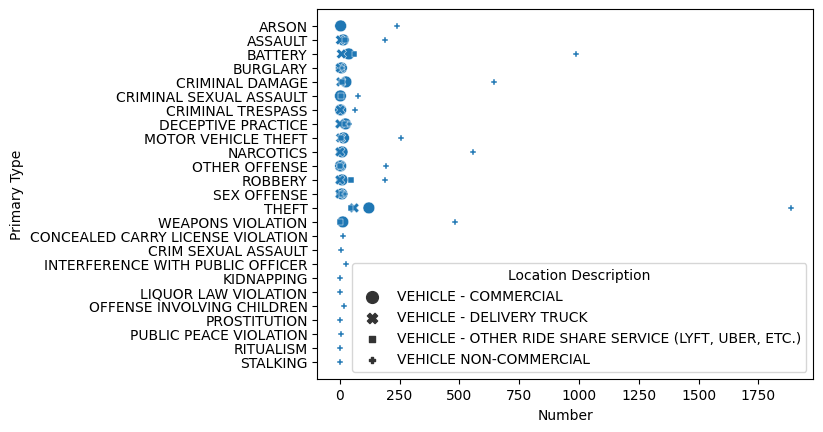

In [183]:
sns.scatterplot(x="Number", y="Primary Type",size="Location Description", style="Location Description", data=df_crimes_covid_location_plot)

In [88]:
df_crimes_covid_location_plot = df_crimes_covid_location_plot.set_index('Location Description')

In [250]:
# Pre COVID Location Description Primary Type GROUPED BY count!
df_crimes_precovid_location = df_crimes_precovid.loc[df_crimes_precovid['Location Description'].str.match("VEHICLE"), ['Location Description', 'Primary Type']]

In [251]:
df_crimes_precovid_location['Location Description'].unique()

array(['VEHICLE-COMMERCIAL', 'VEHICLE NON-COMMERCIAL',
       'VEHICLE - COMMERCIAL',
       'VEHICLE - OTHER RIDE SHARE SERVICE (E.G., UBER, LYFT)',
       'VEHICLE-COMMERCIAL - TROLLEY BUS', 'VEHICLE - DELIVERY TRUCK',
       'VEHICLE-COMMERCIAL - ENTERTAINMENT/PARTY BUS',
       'VEHICLE - OTHER RIDE SHARE SERVICE (LYFT, UBER, ETC.)'],
      dtype=object)

In [252]:
df_crimes_precovid_location.loc[df_crimes_precovid_location['Location Description'] == 'VEHICLE-COMMERCIAL', 'Location Description'] = 'VEHICLE - COMMERCIAL'
len(df_crimes_precovid_location[df_crimes_precovid_location['Location Description'] == 'VEHICLE - COMMERCIAL'])

441

In [253]:
df_crimes_precovid_location.loc[df_crimes_precovid_location['Location Description'] == 'VEHICLE-COMMERCIAL - TROLLEY BUS', 'Location Description'] = 'VEHICLE - COMMERCIAL'
len(df_crimes_precovid_location[df_crimes_precovid_location['Location Description'] == 'VEHICLE - COMMERCIAL'])

451

In [254]:
df_crimes_precovid_location.loc[df_crimes_precovid_location['Location Description'] == 'VEHICLE-COMMERCIAL - ENTERTAINMENT/PARTY BUS', 'Location Description'] = 'VEHICLE - COMMERCIAL'
len(df_crimes_precovid_location[df_crimes_precovid_location['Location Description'] == 'VEHICLE - COMMERCIAL'])

461

In [255]:
df_crimes_precovid_location.loc[df_crimes_precovid_location['Location Description'] == 'VEHICLE - OTHER RIDE SERVICE', 'Location Description'] = 'VEHICLE - OTHER RIDE SHARE SERVICE (LYFT, UBER, ETC.)'
len(df_crimes_precovid_location[df_crimes_precovid_location['Location Description'] == 'VEHICLE - OTHER RIDE SHARE SERVICE (LYFT, UBER, ETC.)'])

14

In [256]:
df_crimes_precovid_location.loc[df_crimes_precovid_location['Location Description'] == 'VEHICLE - OTHER RIDE SHARE SERVICE (E.G., UBER, LYFT)', 'Location Description'] = 'VEHICLE - OTHER RIDE SHARE SERVICE (LYFT, UBER, ETC.)'
len(df_crimes_precovid_location[df_crimes_precovid_location['Location Description'] == 'VEHICLE - OTHER RIDE SHARE SERVICE (LYFT, UBER, ETC.)'])

437

In [257]:
df_crimes_precovid_location_plot = df_crimes_precovid_location.groupby(['Location Description', 'Primary Type']).size().reset_index(name="Number")

C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

<Axes: xlabel='Number', ylabel='Primary Type'>

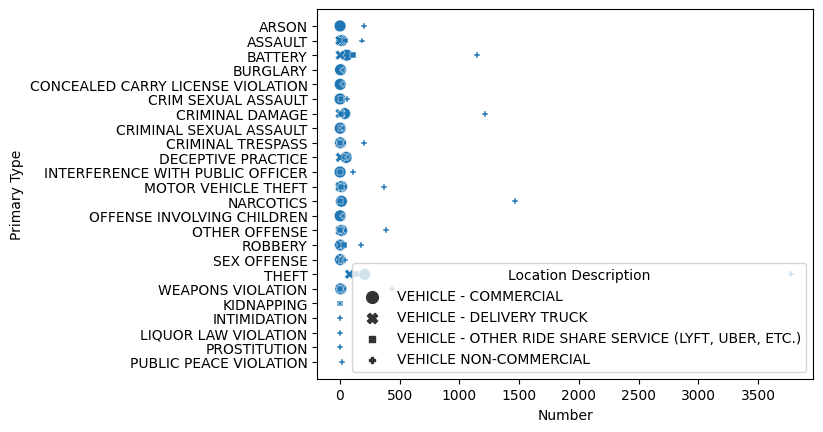

In [258]:
sns.scatterplot(x="Number", y="Primary Type",size="Location Description", style="Location Description", data=df_crimes_precovid_location_plot)

In [259]:
# Post COVID Location Description Primary Type GROUPED BY count!
df_crimes_postcovid_location = df_crimes_postcovid.loc[df_crimes_postcovid['Location Description'].str.match("VEHICLE"), ['Location Description', 'Primary Type']]

In [235]:
df_crimes_postcovid_location['Location Description'].unique()

array(['VEHICLE NON-COMMERCIAL', 'VEHICLE - COMMERCIAL',
       'VEHICLE - DELIVERY TRUCK',
       'VEHICLE - OTHER RIDE SHARE SERVICE (LYFT, UBER, ETC.)'],
      dtype=object)

In [233]:
df_crimes_postcovid_location.loc[df_crimes_postcovid_location['Location Description'] == 'VEHICLE - COMMERCIAL: TROLLEY BUS', 'Location Description'] = 'VEHICLE - COMMERCIAL'
len(df_crimes_postcovid_location[df_crimes_postcovid_location['Location Description'] == 'VEHICLE - COMMERCIAL'])

493

In [234]:
df_crimes_postcovid_location.loc[df_crimes_postcovid_location['Location Description'] == 'VEHICLE - COMMERCIAL: ENTERTAINMENT / PARTY BUS', 'Location Description'] = 'VEHICLE - COMMERCIAL'
len(df_crimes_postcovid_location[df_crimes_postcovid_location['Location Description'] == 'VEHICLE - COMMERCIAL'])

498

In [236]:
df_crimes_postcovid_location_plot = df_crimes_postcovid_location.groupby(['Location Description', 'Primary Type']).size().reset_index(name="Number")

C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

<Axes: xlabel='Number', ylabel='Primary Type'>

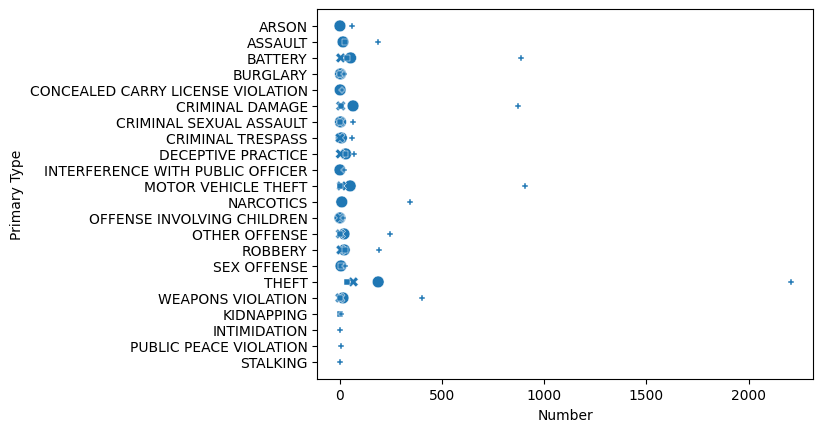

In [393]:
sns.scatterplot(x="Number", y="Primary Type",size="Location Description", style="Location Description", data=df_crimes_postcovid_location_plot, legend=False)

## Heat map for PRE, DURING and POST COVID era

### During COVID

In [239]:
df_crimes_covid

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
1,25953,JE240540,2021-05-24 15:06:00,020XX N LARAMIE AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,True,False,...,36.0,19.0,01A,1141387.0,1913179.0,2021,2023-11-18 15:39:49,41.917838,-87.755969,"(41.917838056, -87.755968972)"
2,26038,JE279849,2021-06-26 09:24:00,062XX N MC CORMICK RD,0110,HOMICIDE,FIRST DEGREE MURDER,PARKING LOT,True,False,...,50.0,13.0,01A,1152781.0,1941458.0,2021,2023-11-18 15:39:49,41.995219,-87.713355,"(41.995219444, -87.713354912)"
25,12218064,JD426642,2020-10-30 16:30:00,011XX E 82ND ST,0266,CRIMINAL SEXUAL ASSAULT,PREDATORY,RESIDENCE,True,True,...,8.0,45.0,02,1185144.0,1850850.0,2020,2023-09-14 15:41:59,41.745883,-87.597168,"(41.745882542, -87.597167639)"
26,12342615,JE202211,2021-04-17 15:20:00,081XX S PRAIRIE AVE,0325,ROBBERY,VEHICULAR HIJACKING,RESIDENCE,True,False,...,6.0,44.0,03,1179448.0,1851073.0,2021,2023-09-14 15:41:59,41.746626,-87.618032,"(41.746626309, -87.618031954)"
27,12416972,JE293535,2020-10-01 00:01:00,031XX W 53RD PL,1753,OFFENSE INVOLVING CHILDREN,SEXUAL ASSAULT OF CHILD BY FAMILY MEMBER,RESIDENCE,False,True,...,14.0,63.0,02,-,-,2020,2023-09-14 15:41:59,-,-,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7949195,13075828,JG264128,2021-04-12 09:00:00,035XX W JACKSON BLVD,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,APARTMENT,False,False,...,28.0,27.0,11,-,-,2021,2023-05-18 15:41:30,-,-,-
7949398,13101397,JG294103,2021-05-04 12:00:00,072XX S PRAIRIE AVE,1242,DECEPTIVE PRACTICE,COMPUTER FRAUD,RESIDENCE,False,False,...,6.0,69.0,11,-,-,2021,2023-06-10 15:41:12,-,-,-
7949768,13120321,JG317146,2021-10-05 00:00:00,007XX E 81ST ST,0910,MOTOR VEHICLE THEFT,AUTOMOBILE,STREET,False,False,...,6.0,44.0,07,-,-,2021,2023-06-27 15:43:37,-,-,-
7950077,13048321,JG160889,2021-09-17 00:00:00,016XX N MASON AVE,1582,OFFENSE INVOLVING CHILDREN,CHILD PORNOGRAPHY,RESIDENCE,True,False,...,29.0,25.0,17,-,-,2021,2023-04-22 15:40:07,-,-,-


In [286]:
df_crimes_covid_latlong = df_crimes_covid[['Latitude', 'Longitude']]

In [287]:
df_crimes_covid_latlong.loc[df_crimes_covid_latlong['Latitude'] == '-', 'Latitude'] = ''
df_crimes_covid_latlong.loc[df_crimes_covid_latlong['Longitude'] == '-', 'Longitude'] = ''

In [289]:
df_crimes_covid_latlong = df_crimes_covid_latlong[['Latitude', 'Longitude']].replace('', np.nan)

In [291]:
df_crimes_covid_latlong = df_crimes_covid_latlong.astype('float')

In [268]:
%matplotlib inline

import pandas as pd
import datashader as ds
from datashader import transfer_functions as tf
from colorcet import fire

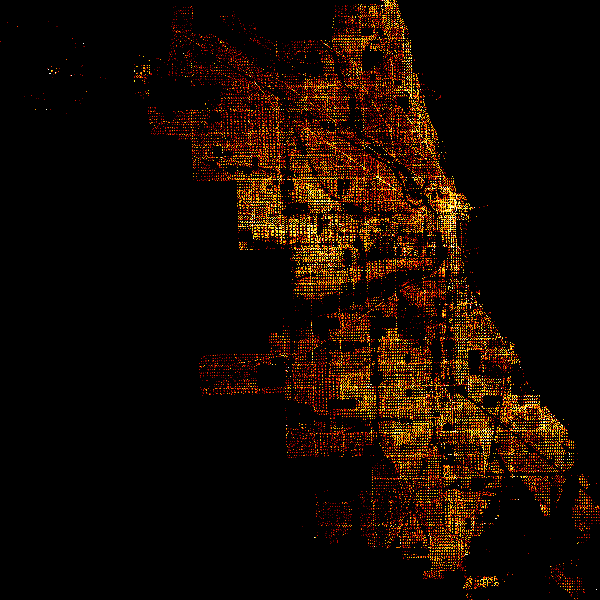

In [389]:
agg = ds.Canvas().points(df_crimes_covid_latlong, 'Longitude', 'Latitude')
tf.set_background(tf.shade(agg, cmap=fire),"black")

### During Pre COVID

In [351]:
df_crimes_precovid_latlong = df_crimes_precovid[['Latitude', 'Longitude']]

In [352]:
df_crimes_precovid_latlong.loc[df_crimes_precovid_latlong['Latitude'] == '-', 'Latitude'] = ''
df_crimes_precovid_latlong.loc[df_crimes_precovid_latlong['Longitude'] == '-', 'Longitude'] = ''

In [353]:
df_crimes_precovid_latlong = df_crimes_precovid_latlong[['Latitude', 'Longitude']].replace('', np.nan)

In [354]:
df_crimes_precovid_latlong = df_crimes_precovid_latlong.astype('float')

In [355]:
print(df_crimes_precovid_latlong['Latitude'].between(0, 37).any())
print(df_crimes_precovid_latlong['Longitude'].between(-87, -80).any())

True
False


In [356]:
df_crimes_precovid_latlong = df_crimes_precovid_latlong[df_crimes_precovid_latlong['Latitude'] > 41]

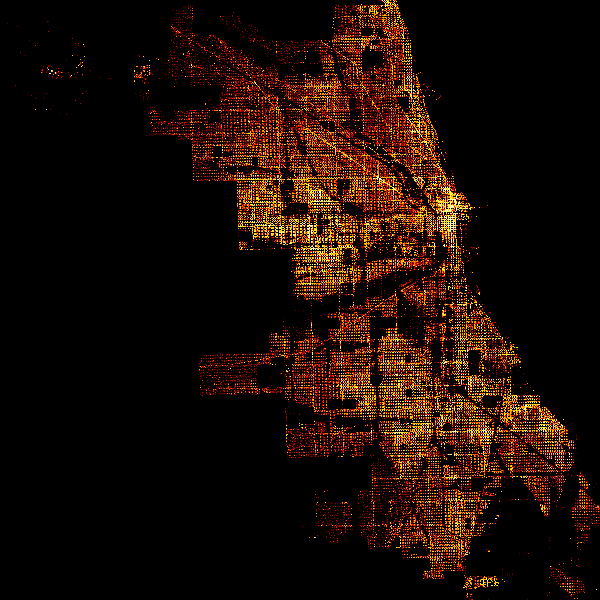

In [357]:
agg = ds.Canvas().points(df_crimes_precovid_latlong, 'Longitude', 'Latitude')
tf.set_background(tf.shade(agg, cmap=fire),"black")

### During Post COVID

In [358]:
df_crimes_postcovid_latlong = df_crimes_postcovid[['Latitude', 'Longitude']]

In [359]:
df_crimes_postcovid_latlong.loc[df_crimes_postcovid_latlong['Latitude'] == '-', 'Latitude'] = ''
df_crimes_postcovid_latlong.loc[df_crimes_postcovid_latlong['Longitude'] == '-', 'Longitude'] = ''

In [360]:
df_crimes_postcovid_latlong = df_crimes_postcovid_latlong[['Latitude', 'Longitude']].replace('', np.nan)

In [361]:
df_crimes_postcovid_latlong = df_crimes_postcovid_latlong.astype('float')

In [362]:
print(df_crimes_postcovid_latlong['Latitude'].between(0, 37).any())
print(df_crimes_postcovid_latlong['Longitude'].between(-87, -80).any())

True
False


In [363]:
df_crimes_postcovid_latlong = df_crimes_postcovid_latlong[df_crimes_postcovid_latlong['Latitude'] > 41]

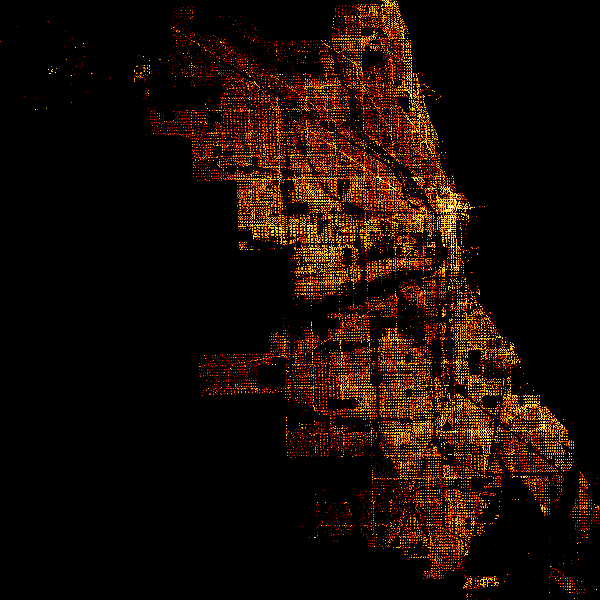

In [364]:
agg = ds.Canvas().points(df_crimes_postcovid_latlong, 'Longitude', 'Latitude')
tf.set_background(tf.shade(agg, cmap=fire),"black")

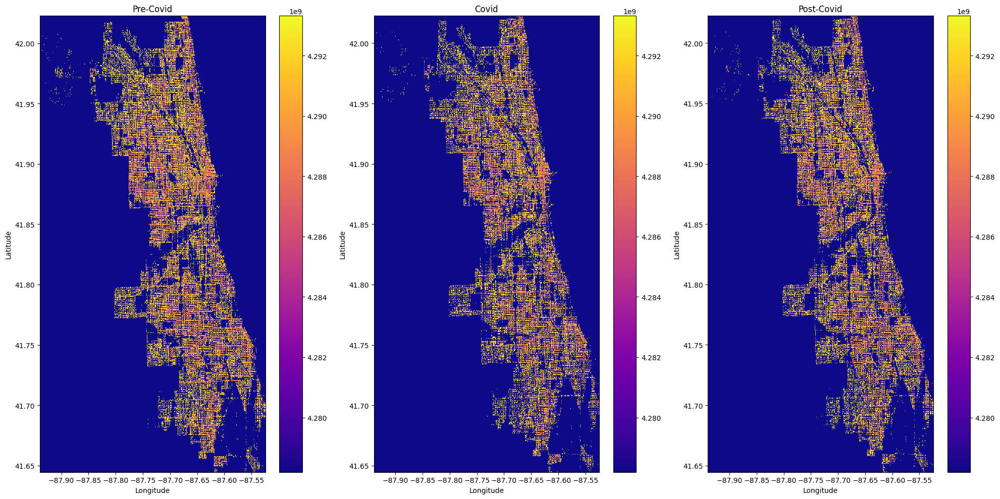

In [392]:
import holoviews as hv
import hvplot.pandas  # Make sure to import hvplot
import datashader.transfer_functions as tf
import datashader as ds
import matplotlib.pyplot as plt


agg = ds.Canvas().points(df_crimes_covid_latlong, 'Longitude', 'Latitude')
agg1 = ds.Canvas().points(df_crimes_precovid_latlong, 'Longitude', 'Latitude')
agg2 = ds.Canvas().points(df_crimes_postcovid_latlong, 'Longitude', 'Latitude')

img = tf.set_background(tf.shade(agg, how='eq_hist'), "black")
img1 = tf.set_background(tf.shade(agg1, how='eq_hist'), "black")
img2 = tf.set_background(tf.shade(agg2, how='eq_hist'), "black")

fig, axs = plt.subplots(1, 3, figsize=(20, 10))


tf.dynspread(img1, threshold=1).plot(ax=axs[0], cmap='plasma')
axs[0].set_title('Pre-Covid')
tf.dynspread(img, threshold=0.5).plot(ax=axs[1], cmap='plasma')
axs[1].set_title('Covid')
tf.dynspread(img2, threshold=0.5).plot(ax=axs[2], cmap='plasma')
axs[2].set_title('Post-Covid')

plt.tight_layout()
plt.show()

## Choropleth Maps - Based on Districts

In [396]:
import numpy as np # linear algebra
import pandas as pd # data processing
import folium
from folium import IFrame, FeatureGroup, LayerControl, Map, Marker, plugins
import seaborn as sns
import matplotlib.pyplot as plt

In [395]:
pip install folium


[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip



  Obtaining dependency information for folium from https://files.pythonhosted.org/packages/18/09/8569904c8ce5679cc02826d98de633c07abcd2443a23181e5f71ff9dacbc/folium-0.15.1-py2.py3-none-any.whl.metadata
  Obtaining dependency information for branca>=0.6.0 from https://files.pythonhosted.org/packages/2f/e7/603b136221de923055716d23e3047da71f92e0d8ba2c4517ce49a54fe768/branca-0.7.0-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/97.0 kB ? eta -:--:--
   ---------------------------------------- 0.0/97.0 kB ? eta -:--:--
   ------------ --------------------------- 30.7/97.0 kB 435.7 kB/s eta 0:00:01
   ------------------------- -------------- 61.4/97.0 kB 544.7 kB/s eta 0:00:01
   ---------------------------------------- 97.0/97.0 kB 694.4 kB/s eta 0:00:00


## COVID era

In [487]:
WardCrimes_covid = pd.DataFrame(df_crimes_covid['Ward'].value_counts().astype(float))
WardCrimes_covid = WardCrimes_covid.reset_index()
WardCrimes_covid.columns = ['Ward', 'Crime_Count']
WardCrimes_covid = WardCrimes_covid.replace('-', None)
WardCrimes_covid = WardCrimes_covid.dropna()

In [488]:
WardCrimes_covid['Ward'] = WardCrimes_covid['Ward'].astype('int')
WardCrimes_covid['Ward'] = WardCrimes_covid['Ward'].astype('str')

In [524]:
Chicago_COORDINATES = (41.895140898, -87.624255632)

map1 = folium.Map(location=Chicago_COORDINATES, zoom_start=11)

district_geo = r"C:\Users\nkarv\Downloads\Boundaries - Wards (2015-2023).geojson"
folium.Choropleth(geo_data = district_geo, 
                #data_out = 'Ward_Map.json', 
                data = WardCrimes_covid,
                columns = ['Ward', 'Crime_Count'],
                key_on = 'feature.properties.ward',
                fill_color = 'YlOrRd', 
                fill_opacity = 1,
                line_opacity = 1,
                threshold_scale=[0, 5000, 10000, 15000, 20000, 25000, 30000, 40000, 45000, 50000, 55000],
                legend_name = 'Number of incidents per police ward 2016').add_to(map1)

folium.LayerControl().add_to(map1)
map1

## Pre COVID era

In [491]:
WardCrimes_precovid = pd.DataFrame(df_crimes_precovid['Ward'].value_counts().astype(float))
WardCrimes_precovid = WardCrimes_precovid.reset_index()
WardCrimes_precovid.columns = ['Ward', 'Crime_Count']
WardCrimes_precovid = WardCrimes_precovid.replace('-', None)
WardCrimes_precovid = WardCrimes_precovid.dropna()

In [492]:
WardCrimes_precovid['Ward'] = WardCrimes_precovid['Ward'].astype('int')
WardCrimes_precovid['Ward'] = WardCrimes_precovid['Ward'].astype('str')

In [523]:
Chicago_COORDINATES = (41.895140898, -87.624255632)

map2 = folium.Map(location=Chicago_COORDINATES, zoom_start=11)

district_geo = r"C:\Users\nkarv\Downloads\Boundaries - Wards (2015-2023).geojson"
folium.Choropleth(geo_data = district_geo, 
                #data_out = 'Ward_Map.json', 
                data = WardCrimes_precovid,
                columns = ['Ward', 'Crime_Count'],
                key_on = 'feature.properties.ward',
                fill_color = 'YlOrRd', 
                fill_opacity = 1,
                line_opacity = 1,
                threshold_scale=[0, 5000, 10000, 15000, 20000, 25000, 30000, 40000, 45000, 50000, 55000],
                legend_name = 'Number of incidents per police ward 2016').add_to(map2)

folium.LayerControl().add_to(map2)
map2

## Post COVID era

In [513]:
WardCrimes_postcovid = pd.DataFrame(df_crimes_postcovid['Ward'].value_counts().astype(float))
WardCrimes_postcovid = WardCrimes_postcovid.reset_index()
WardCrimes_postcovid.columns = ['Ward', 'Crime_Count']
WardCrimes_postcovid = WardCrimes_postcovid.replace('-', None)
WardCrimes_postcovid = WardCrimes_postcovid.dropna()

In [514]:
WardCrimes_postcovid['Ward'] = WardCrimes_postcovid['Ward'].astype('int')
WardCrimes_postcovid['Ward'] = WardCrimes_postcovid['Ward'].astype('str')

In [522]:
Chicago_COORDINATES = (41.895140898, -87.624255632)

map3 = folium.Map(location=Chicago_COORDINATES, zoom_start=11)

district_geo = r"C:\Users\nkarv\Downloads\Boundaries - Wards (2015-2023).geojson"
folium.Choropleth(geo_data = district_geo, 
                #data_out = 'Ward_Map.json', 
                data = WardCrimes_postcovid,
                columns = ['Ward', 'Crime_Count'],
                key_on = 'feature.properties.ward',
                fill_color = 'YlOrRd', 
                fill_opacity = 1,
                line_opacity = 1,
                threshold_scale=[0, 5000, 10000, 15000, 20000, 25000, 30000, 40000, 45000, 50000, 55000],
                legend_name = 'Crimes happened during POST COVID era').add_to(map3)

folium.LayerControl().add_to(map3)
map3

## No of ARRESTS made based on the District Information

In [543]:
df_crimes_covid_arrests = df_crimes_covid[['District', 'Arrest']]
df_crimes_covid_arrests

,District,Arrest
1,25.0,True
2,17.0,True
25,4.0,True
26,6.0,True
27,9.0,False
...,...,...
7949195,11.0,False
7949398,3.0,False
7949768,6.0,False
7950077,25.0,True


In [544]:
df_crimes_covid_arrests = df_crimes_covid_arrests.groupby(['District', 'Arrest']).size().reset_index(name="Number")

In [545]:
df_crimes_covid_arrests['District'] = df_crimes_covid_arrests['District'].astype('int')
df_crimes_covid_arrests['District'] = df_crimes_covid_arrests['District'].astype('str')


,District,Arrest,Number
0,1,False,14727
1,1,True,2876
2,2,False,17312
3,2,True,1823
4,3,False,19127
5,3,True,2499
6,4,False,21746
7,4,True,3017
8,5,False,16999
9,5,True,2893


C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

<Axes: xlabel='District', ylabel='Number'>

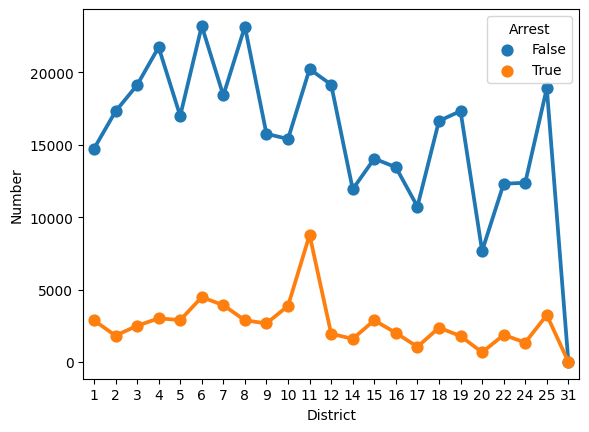

In [549]:
sns.pointplot(data = df_crimes_covid_arrests, x="District", y="Number", hue="Arrest")

### Pre COVID Era

In [562]:
df_crimes_precovid_arrests = df_crimes_precovid[['District', 'Arrest']]
df_crimes_precovid_arrests

,District,Arrest
24,6.0,False
38,11.0,True
46,25.0,False
849,19.0,False
850,24.0,False
...,...,...
7948526,6.0,False
7949370,8.0,False
7949637,10.0,False
7949804,4.0,False


In [563]:
df_crimes_precovid_arrests = df_crimes_precovid_arrests.groupby(['District', 'Arrest']).size().reset_index(name="Number")

In [564]:
df_crimes_precovid_arrests = df_crimes_precovid_arrests.replace('-', None)
df_crimes_precovid_arrests = df_crimes_precovid_arrests.dropna()

In [565]:
df_crimes_precovid_arrests['District'] = df_crimes_precovid_arrests['District'].astype('int')
df_crimes_precovid_arrests['District'] = df_crimes_precovid_arrests['District'].astype('str')

C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

<Axes: xlabel='District', ylabel='Number'>

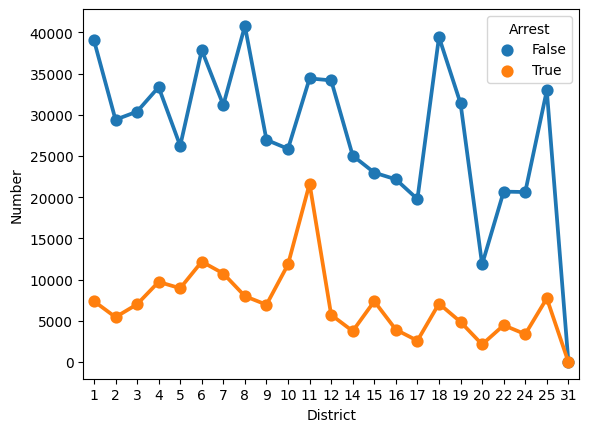

In [566]:
sns.pointplot(data = df_crimes_precovid_arrests, x="District", y="Number", hue="Arrest")

### Post COVID era

In [567]:
df_crimes_postcovid_arrests = df_crimes_postcovid[['District', 'Arrest']]
df_crimes_postcovid_arrests

,District,Arrest
3,19.0,False
4,6.0,False
6,1.0,False
7,12.0,False
8,3.0,False
...,...,...
7950971,12.0,False
7950972,6.0,False
7950973,10.0,False
7950974,4.0,False


In [568]:
df_crimes_postcovid_arrests = df_crimes_postcovid_arrests.groupby(['District', 'Arrest']).size().reset_index(name="Number")

In [569]:
df_crimes_postcovid_arrests = df_crimes_postcovid_arrests.replace('-', None)
df_crimes_postcovid_arrests = df_crimes_postcovid_arrests.dropna()

In [570]:
df_crimes_postcovid_arrests['District'] = df_crimes_postcovid_arrests['District'].astype('int')
df_crimes_postcovid_arrests['District'] = df_crimes_postcovid_arrests['District'].astype('str')

C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\nkarv\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

<Axes: xlabel='District', ylabel='Number'>

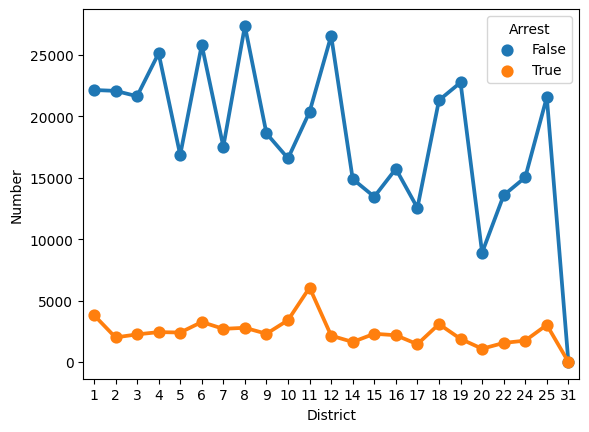

In [571]:
sns.pointplot(data = df_crimes_postcovid_arrests, x="District", y="Number", hue="Arrest")

## No of Domestic Violences

In [596]:
df_crimes_domestic_latlong = df_crimes_covid[['Domestic', 'Latitude', 'Longitude']]

In [597]:
df_crimes_domestic_latlong = df_crimes_domestic_latlong.replace('-', None)
df_crimes_domestic_latlong = df_crimes_domestic_latlong.dropna()

In [598]:
df_crimes_domestic_latlong['Latitude'] = df_crimes_domestic_latlong['Latitude'].astype('float')
df_crimes_domestic_latlong['Latitude'] = df_crimes_domestic_latlong['Latitude'].round(2)

In [599]:
df_crimes_domestic_latlong['Longitude'] = df_crimes_domestic_latlong['Longitude'].astype('float')
df_crimes_domestic_latlong['Longitude'] = df_crimes_domestic_latlong['Longitude'].round(2)

In [601]:
df_crimes_domestic_latlong = df_crimes_domestic_latlong.groupby(['Latitude', 'Longitude', 'Domestic']).size().reset_index(name="Number")

In [602]:
df_crimes_domestic_latlong

,Latitude,Longitude,Domestic,Number
0,41.64,-87.62,False,1
1,41.64,-87.61,False,9
2,41.64,-87.61,True,2
3,41.64,-87.60,False,4
4,41.64,-87.54,False,1
...,...,...,...,...
1383,42.02,-87.68,True,148
1384,42.02,-87.67,False,1362
1385,42.02,-87.67,True,332
1386,42.02,-87.66,False,138


In [609]:
df_crimes_domestic_latlong_true = df_crimes_domestic_latlong[df_crimes_domestic_latlong['Domestic'] == True]

In [610]:
df_crimes_domestic_latlong_true

,Latitude,Longitude,Domestic,Number
2,41.64,-87.61,True,2
6,41.65,-87.62,True,68
8,41.65,-87.61,True,85
10,41.65,-87.60,True,98
12,41.65,-87.59,True,6
...,...,...,...,...
1379,42.02,-87.70,True,6
1381,42.02,-87.69,True,58
1383,42.02,-87.68,True,148
1385,42.02,-87.67,True,332


In [624]:
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()

In [637]:
fig = px.density_mapbox(df_crimes_domestic_latlong_true, lat = 'Latitude', lon = 'Longitude', z = 'Number',
                        radius = 8,
                        center = dict(lat = 41.895140898, lon = -87.624255632),
                        zoom = 6,
                        mapbox_style = 'carto-positron')
fig.show()

### Pre COVID era

In [628]:
df_crimes_precovid_domestic_latlong = df_crimes_precovid[['Domestic', 'Latitude', 'Longitude']]

In [629]:
df_crimes_precovid_domestic_latlong = df_crimes_precovid_domestic_latlong.replace('-', None)
df_crimes_precovid_domestic_latlong = df_crimes_precovid_domestic_latlong.dropna()

In [630]:
df_crimes_precovid_domestic_latlong['Longitude'] = df_crimes_precovid_domestic_latlong['Longitude'].astype('float')
df_crimes_precovid_domestic_latlong['Longitude'] = df_crimes_precovid_domestic_latlong['Longitude'].round(2)

In [632]:
df_crimes_precovid_domestic_latlong['Latitude'] = df_crimes_precovid_domestic_latlong['Latitude'].astype('float')
df_crimes_precovid_domestic_latlong['Latitude'] = df_crimes_precovid_domestic_latlong['Latitude'].round(2)

In [633]:
df_crimes_precovid_domestic_latlong = df_crimes_precovid_domestic_latlong.groupby(['Latitude', 'Longitude', 'Domestic']).size().reset_index(name="Number")

In [634]:
df_crimes_precovid_domestic_latlong_true = df_crimes_precovid_domestic_latlong[df_crimes_precovid_domestic_latlong['Domestic'] == True]

In [636]:
fig1 = px.density_mapbox(df_crimes_precovid_domestic_latlong_true, lat = 'Latitude', lon = 'Longitude', z = 'Number',
                        radius = 8,
                        center = dict(lat = 41.895140898, lon = -87.624255632),
                        zoom = 6,
                        mapbox_style = 'carto-positron')
fig1.show()

### Post COVID era

In [638]:
df_crimes_postcovid_domestic_latlong = df_crimes_postcovid[['Domestic', 'Latitude', 'Longitude']]

In [639]:
df_crimes_postcovid_domestic_latlong = df_crimes_postcovid_domestic_latlong.replace('-', None)
df_crimes_postcovid_domestic_latlong = df_crimes_postcovid_domestic_latlong.dropna()

In [640]:
df_crimes_postcovid_domestic_latlong['Longitude'] = df_crimes_postcovid_domestic_latlong['Longitude'].astype('float')
df_crimes_postcovid_domestic_latlong['Longitude'] = df_crimes_postcovid_domestic_latlong['Longitude'].round(2)

In [641]:
df_crimes_postcovid_domestic_latlong['Latitude'] = df_crimes_postcovid_domestic_latlong['Latitude'].astype('float')
df_crimes_postcovid_domestic_latlong['Latitude'] = df_crimes_postcovid_domestic_latlong['Latitude'].round(2)

In [642]:
df_crimes_postcovid_domestic_latlong = df_crimes_postcovid_domestic_latlong.groupby(['Latitude', 'Longitude', 'Domestic']).size().reset_index(name="Number")

In [643]:
df_crimes_postcovid_domestic_latlong_true = df_crimes_postcovid_domestic_latlong[df_crimes_postcovid_domestic_latlong['Domestic'] == True]

In [651]:
fig2 = px.density_mapbox(df_crimes_postcovid_domestic_latlong_true, lat = 'Latitude', lon = 'Longitude', z = 'Number',
                        radius = 8,
                        center = dict(lat = 41.895140898, lon = -87.624255632),
                        zoom = 6,
                        mapbox_style = 'carto-positron')
fig2.show()